# FOSA
(old: FOSA-CM)

Ou Deng on Aug 10, 2023.
- Updated on Aug 12, 2023
- Updateed on Aug 24, 2023

In [1]:
# 显示当前ipynb文件所在位置。
import os
os.getcwd()

'/Users/deng/Deng Dropbox/Deng Ou/Study_D2/0学術活動/p920_minano/FOSA+SAFO'

In [2]:
# 显示当前conda环境
!conda info --envs
#!conda info

# conda environments:
#
base                     /opt/anaconda3
A3C-torch                /opt/anaconda3/envs/A3C-torch
PyTorch-py39             /opt/anaconda3/envs/PyTorch-py39
Pytorch-38               /opt/anaconda3/envs/Pytorch-38
causalnex38           *  /opt/anaconda3/envs/causalnex38
dowhy38                  /opt/anaconda3/envs/dowhy38
mozart                   /opt/anaconda3/envs/mozart
orange3                  /opt/anaconda3/envs/orange3
pynetlogo                /opt/anaconda3/envs/pynetlogo



In [3]:
import torch
print('torch version:', torch.__version__)

if torch.cuda.is_available():
    print(torch.cuda.get_device_name())
    print(torch.cuda.get_device_capability())
else:
    print('torch.cuda.is_available()=', torch.cuda.is_available())

torch version: 1.13.1
torch.cuda.is_available()= False


## Experiment-I on Simulated Datasets

          A         B         C         D          E
0  0.711674 -1.035702 -0.324028  1.747375   4.497062
1 -0.324485  0.043306 -0.281179 -0.367791  -2.301117
2 -1.001871  1.646860  0.644989 -2.648731  -7.049025
3  0.236251  0.064989  0.301240  0.171262   1.794544
4 -0.102160  0.046370 -0.055790 -0.148530  -0.161910
5 -1.141293 -0.759843 -1.901136 -0.381449  -5.073170
6  2.654407  1.189920  3.844327  1.464488  11.851384
7  1.440605  0.867495  2.308100  0.573110   6.232421
8  0.098902  0.662477  0.761379 -0.563575  -0.566299
9 -3.121532 -0.517835 -3.639367 -2.603697 -15.173460
FIML estimation succeeded.
KL Divergences for FIML Imputation on Test Data (Only for Missing Data):
{'A': 178.87, 'B': 153.057, 'C': 165.099, 'D': 125.775, 'E': 9.646}

Error Metrics for FIML Imputation on Test Data (Only for Missing Data):
  Variable     MSE  R-squared  MAPE (%)
0        A   0.088      0.896    84.326
1        B   1.433     -0.213   174.755
2        C   1.600     -0.315   247.087
3        D   3.0

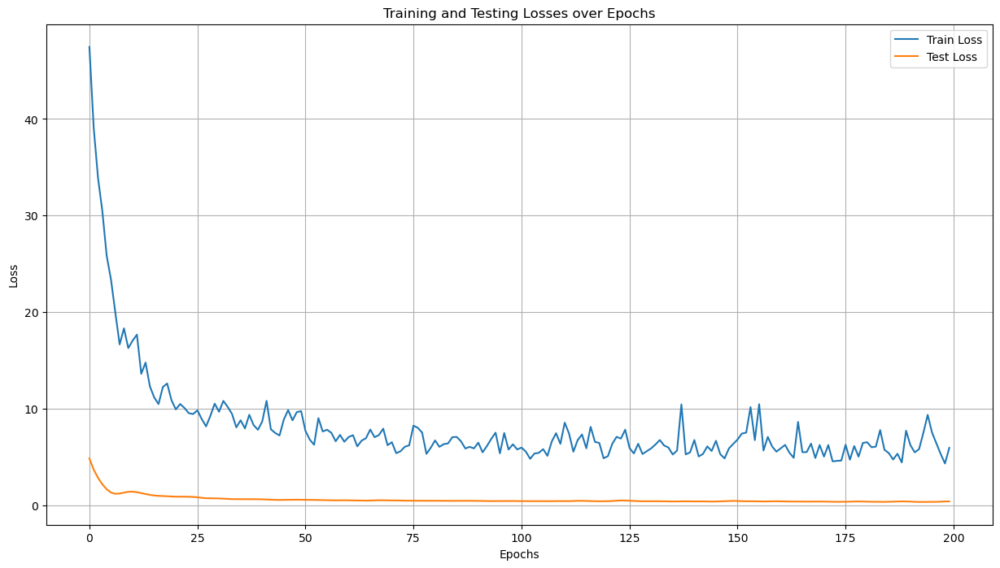


KL Divergences for Self-Attention Predictions (Only for Missing Data):
{'A': 179.488, 'B': 115.49, 'C': 125.191, 'D': 126.22, 'E': 22.36}

Error Metrics for Self-Attention Predictions (Only for Missing Data):
  Variable    MSE  R-squared  MAPE (%)
0        A  0.065      0.923    53.739
1        B  0.457      0.613    65.413
2        C  0.638      0.476   146.719
3        D  0.714      0.664   197.974
4        E  2.278      0.924    70.424


In [43]:
# FOSA  MSE结合协方差矩阵（CM）为损失函数。
# ver 2.0 on Aug 12, 2023. 和其他方法比较好。修正了数据标准化的信息泄漏问题。

import os
import torch
import torch.nn as nn
import torch.optim as optim
from semopy import Model
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

# Self-Attention Model Definition
class SelfAttentionModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, num_heads, dropout_rate):
        super(SelfAttentionModel, self).__init__()
        self.hidden_dim = hidden_dim
        self.embed_dim = hidden_dim
        self.linear = nn.Linear(input_dim, hidden_dim)
        self.attention = nn.MultiheadAttention(embed_dim=self.embed_dim, num_heads=num_heads)
        self.fc1 = nn.Linear(hidden_dim, hidden_dim)
        self.dropout = nn.Dropout(dropout_rate)
        self.fc2 = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        if x.dim() == 2:
            x = x.unsqueeze(1)
        batch_size, seq_length, feature_dim = x.size()
        x = x.view(batch_size * seq_length, feature_dim)
        x = self.linear(x)
        x = x.view(batch_size, seq_length, self.hidden_dim)
        x = x.transpose(0, 1)
        attn_output, _ = self.attention(x, x, x)
        attn_output = attn_output.transpose(0, 1)
        attn_output = torch.mean(attn_output, dim=1)
        x = self.fc1(attn_output)
        x = self.dropout(x)
        x = torch.relu(x)
        x = self.fc2(x)
        return x.squeeze()

# Evaluation functions: KL, MAPE
def compute_kl_divergence(p, q):
    p = np.asarray(p, dtype=np.float64) + 1e-10
    q = np.asarray(q, dtype=np.float64) + 1e-10
    return np.sum(np.where(p != 0, p * np.log(p / q), 0))

def compute_mape(true_values, predicted_values):
    return np.mean(np.abs((true_values - predicted_values) / true_values)) * 100

# Seed for reproducibility
np.random.seed(2023)

# Simulated dataset
n = 500
A = np.random.normal(0, 1, n)
B = np.random.normal(0, 1, n)

# Pattern(a)
C = A + B
D = A - B

#Pattern(b)
#C = A + 2*B**2
#D = A * B

E = 2*C + 3*D + np.random.normal(0, 0.5, n)
dataset_1 = pd.DataFrame({'A': A, 'B': B, 'C': C, 'D': D, 'E': E})
print(dataset_1.head(10))

'''为了避免信息泄漏，我们应该首先拆分数据集，然后使用训练集来拟合StandardScaler，
接着使用这个scaler来分别标准化训练集和测试集。之后，我们可以在标准化的数据上引入缺失值。
'''

# Split the original dataset_1 into training and testing set
train_data, test_data = train_test_split(dataset_1, test_size=0.2, random_state=2023)

# Standardize the data using only the training data
scaler = StandardScaler()
train_data_scaled = pd.DataFrame(scaler.fit_transform(train_data), columns=train_data.columns)
test_data_scaled = pd.DataFrame(scaler.transform(test_data), columns=test_data.columns)

# Introduce missingness in the standardized dataset
def introduce_missing(data, missing_rate=0.2):
    modified_data = data.copy()
    for col in data.columns:
        mask = (np.random.random(len(data)) < missing_rate)
        modified_data[col][mask] = np.nan
    return modified_data

train_data_missing = introduce_missing(train_data_scaled)
test_data_missing = introduce_missing(test_data_scaled)

#train_data_missing = dataset_2_missing.iloc[train_data_scaled.index]
#test_data_missing = dataset_2_missing.iloc[test_data_scaled.index]

# Model specification.
# 这个模型结构来源于经验或专业知识。是FIML这类SEM方法必须的，也是整个算法的弱点。
model_desc = """
E ~ A + B + C + D
"""

# Use column means to fill NaN values as an initial approximation
initial_filled_train_data = train_data_missing.fillna(train_data_missing.mean())

# Use the initialized data to estimate using FIML
mod = Model(model_desc)
res = mod.fit(initial_filled_train_data, obj="FIML")

# Check if it's successful
if res.success:
    print("FIML estimation succeeded.")
    fiml_train_predictions = mod.predict(train_data_missing)
    fiml_test_predictions = mod.predict(test_data_missing)
else:
    print("FIML estimation failed. Please consider adjusting optimization parameters or use another approach.")

train_inputs_np = np.where(np.isnan(train_data_missing.values), fiml_train_predictions.values, train_data_missing.values)
test_inputs_np = np.where(np.isnan(test_data_missing.values), fiml_test_predictions.values, test_data_missing.values)

# Evaluation functions for FIML on test data
missing_rows_test_fiml, missing_cols_test_fiml = np.where(np.isnan(test_data_missing.values))
test_true_missing_fiml = test_data.to_numpy()[missing_rows_test_fiml, missing_cols_test_fiml]
test_inputs_fiml_missing = test_inputs_np[missing_rows_test_fiml, missing_cols_test_fiml]

kl_divergences_fiml_test = {}
for idx, col in enumerate(dataset_1.columns):
    col_mask = (missing_cols_test_fiml == idx)
    p = np.histogram(test_true_missing_fiml[col_mask], bins=50, density=True)[0]
    q = np.histogram(test_inputs_fiml_missing[col_mask], bins=50, density=True)[0]
    kl_divergences_fiml_test[col] = round(compute_kl_divergence(p, q), 3)

print("KL Divergences for FIML Imputation on Test Data (Only for Missing Data):")
print(kl_divergences_fiml_test)

# Error metrics for FIML on test data
error_metrics_fiml_test = {'Variable': [], 'MSE': [], 'R-squared': [], 'MAPE (%)': []}
for idx, col in enumerate(dataset_1.columns):
    col_mask = (missing_cols_test_fiml == idx)
    true_values = test_true_missing_fiml[col_mask]
    predicted_values = test_inputs_fiml_missing[col_mask]
    
    mse = round(mean_squared_error(true_values, predicted_values), 3)
    r2 = round(r2_score(true_values, predicted_values), 3)
    mape = round(compute_mape(true_values, predicted_values), 3)
    
    error_metrics_fiml_test['Variable'].append(col)
    error_metrics_fiml_test['MSE'].append(mse)
    error_metrics_fiml_test['R-squared'].append(r2)
    error_metrics_fiml_test['MAPE (%)'].append(mape)

error_metrics_df_fiml_test = pd.DataFrame(error_metrics_fiml_test)
print("\nError Metrics for FIML Imputation on Test Data (Only for Missing Data):")
print(error_metrics_df_fiml_test)


# Convert to tensors
train_inputs = torch.tensor(train_inputs_np).float().to(device)
test_inputs = torch.tensor(test_inputs_np).float().to(device)
train_targets = torch.tensor(train_data.to_numpy()).float().to(device)
test_targets = torch.tensor(test_data.to_numpy()).float().to(device)

# Model parameters
input_dim = train_data.shape[1]
output_dim = test_data.shape[1]
num_heads = 4 #4
hidden_dim = 64 #64
dropout_rate = 0.5 #0.5

# Initialize the model with He initialization
# 主要的改动是在weights_init函数中，使用了torch.nn.init.kaiming_uniform_来进行He初始化。
# 对于ReLU，He初始化比Xavier初始化更合适。
def weights_init(m):
    if isinstance(m, nn.Linear):
        torch.nn.init.kaiming_uniform_(m.weight, nonlinearity='relu')
        if m.bias is not None:
            torch.nn.init.zeros_(m.bias)

attention_model = SelfAttentionModel(input_dim, hidden_dim, output_dim, num_heads, dropout_rate).to(device)
attention_model.apply(weights_init)

# Optimizer and Loss
optimizer = optim.Adam(attention_model.parameters(), lr=0.001)
criterion = nn.MSELoss()

# Define covariance loss function
def covariance_loss(predicted, target):
    cov_pred = torch.matmul(predicted.T, predicted) / predicted.size(0)
    cov_target = torch.matmul(target.T, target) / target.size(0)
    loss = torch.norm(cov_pred - cov_target, p='fro')
    return loss

# L1 Regularization function
def l1_regularizer(model):
    l1 = torch.tensor(0.).to(device)
    for name, param in model.named_parameters():
        if 'weight' in name:
            l1 = l1 + torch.norm(param, 1)
    return l1

l1_lambda = 0.001

# Training loop
num_epochs = 200
train_losses = []
test_losses = []

for epoch in range(num_epochs):
    attention_model.train()
    optimizer.zero_grad()
    outputs = attention_model(train_inputs)
    
    # Calculate the combined loss
    mse_loss = criterion(outputs, train_targets)
    cov_loss = covariance_loss(outputs, train_targets)
    total_loss = mse_loss + cov_loss + l1_lambda * l1_regularizer(attention_model)
    
    total_loss.backward()
    torch.nn.utils.clip_grad_norm_(attention_model.parameters(), max_norm=1.0)
    optimizer.step()
    
    # Evaluation
    attention_model.eval()
    with torch.no_grad():
        test_outputs = attention_model(test_inputs)
        test_loss = criterion(test_outputs, test_targets)
    
    train_losses.append(total_loss.item())
    test_losses.append(test_loss.item())

# Plotting the losses
plt.figure(figsize=(15, 8))
plt.plot(train_losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Testing Losses over Epochs')
plt.legend()
plt.grid(True)
plt.show()


# Prediction
attention_model.eval()
with torch.no_grad():
    train_predictions = attention_model(torch.tensor(train_inputs_np).float().to(device))
    test_predictions = attention_model(torch.tensor(test_inputs_np).float().to(device))

train_predictions_np = train_predictions.cpu().numpy()
test_predictions_np = test_predictions.cpu().numpy()

# Evaluation for the Self-Attention model
missing_rows_test, missing_cols_test = np.where(np.isnan(test_data_missing.values))
test_true_missing = test_data.to_numpy()[missing_rows_test, missing_cols_test]
test_predictions_np_missing = test_predictions_np[missing_rows_test, missing_cols_test]

kl_divergences_attention = {}
for idx, col in enumerate(dataset_1.columns):
    col_mask = (missing_cols_test == idx)
    p = np.histogram(test_true_missing[col_mask], bins=50, density=True)[0]
    q = np.histogram(test_predictions_np_missing[col_mask], bins=50, density=True)[0]
    kl_divergences_attention[col] = round(compute_kl_divergence(p, q), 3)

print("\nKL Divergences for Self-Attention Predictions (Only for Missing Data):")
print(kl_divergences_attention)

error_metrics_attention = {'Variable': [], 'MSE': [], 'R-squared': [], 'MAPE (%)': []}
for idx, col in enumerate(dataset_1.columns):
    col_mask = (missing_cols_test == idx)
    true_values = test_true_missing[col_mask]
    predicted_values = test_predictions_np_missing[col_mask]
    
    mse = round(mean_squared_error(true_values, predicted_values), 3)
    r2 = round(r2_score(true_values, predicted_values), 3)
    mape = round(compute_mape(true_values, predicted_values), 3)
    
    error_metrics_attention['Variable'].append(col)
    error_metrics_attention['MSE'].append(mse)
    error_metrics_attention['R-squared'].append(r2)
    error_metrics_attention['MAPE (%)'].append(mape)

error_metrics_df_attention = pd.DataFrame(error_metrics_attention)
print("\nError Metrics for Self-Attention Predictions (Only for Missing Data):")
print(error_metrics_df_attention)



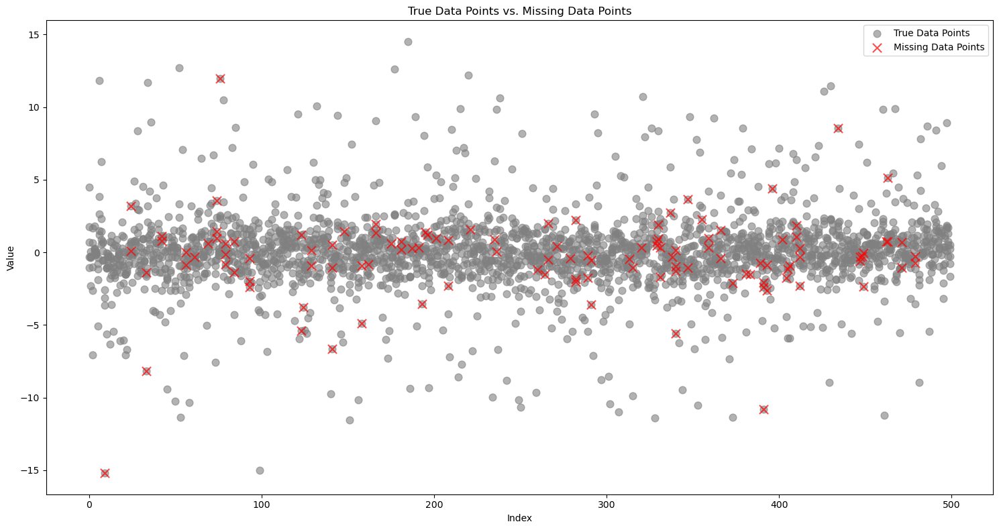

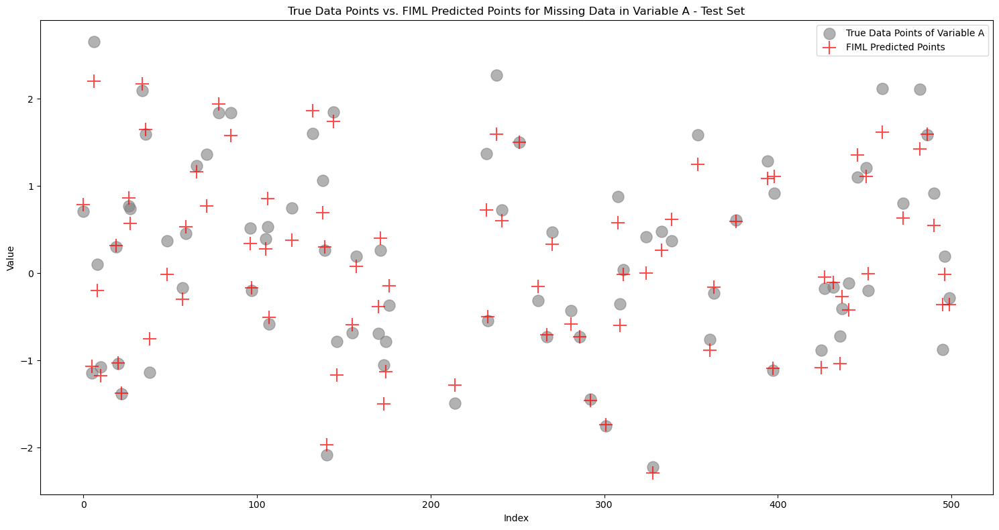

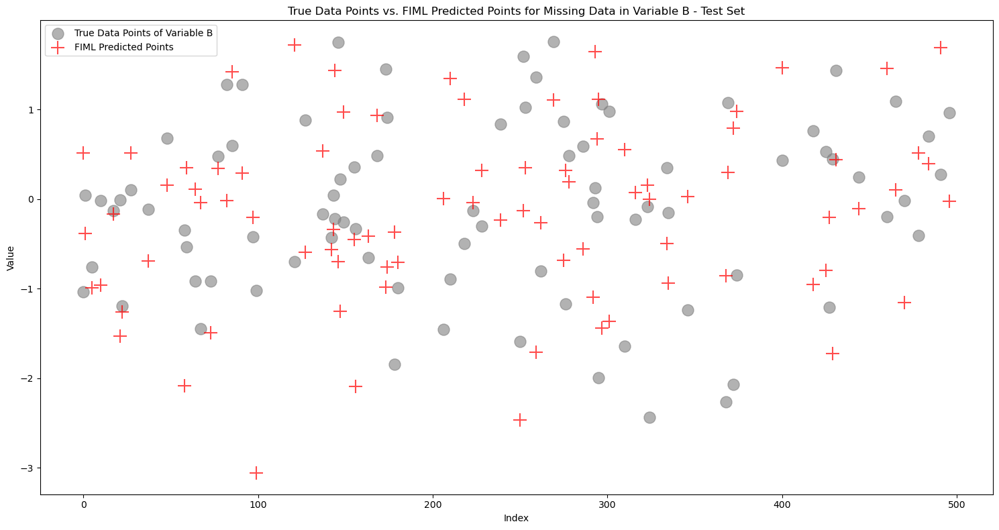

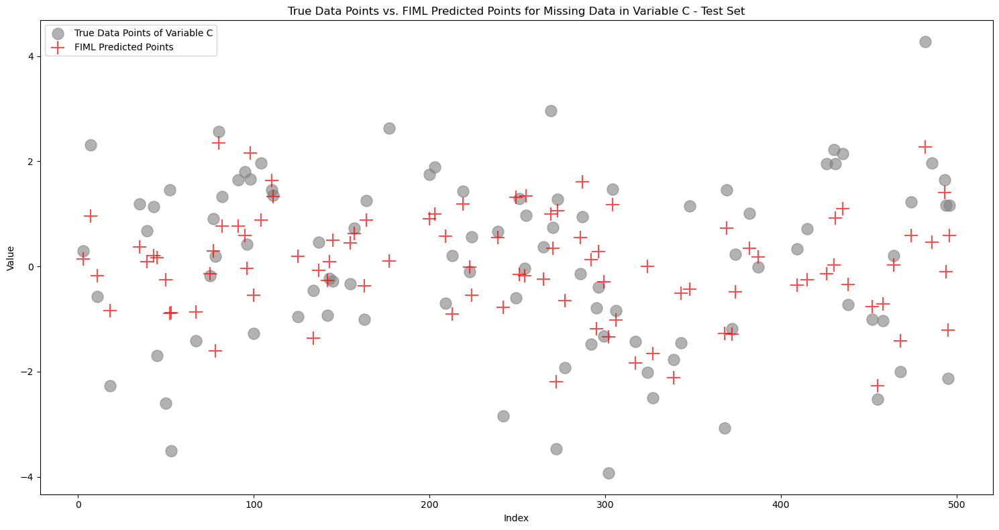

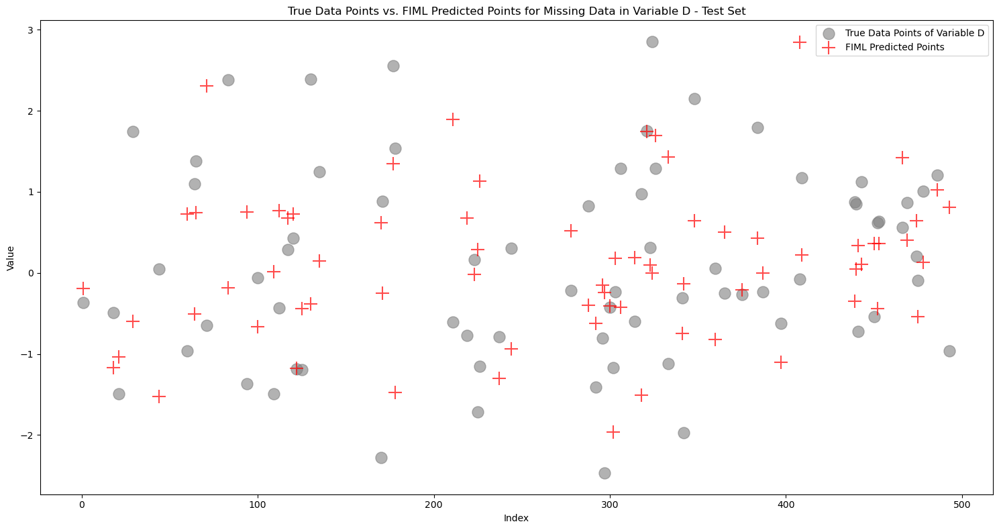

...

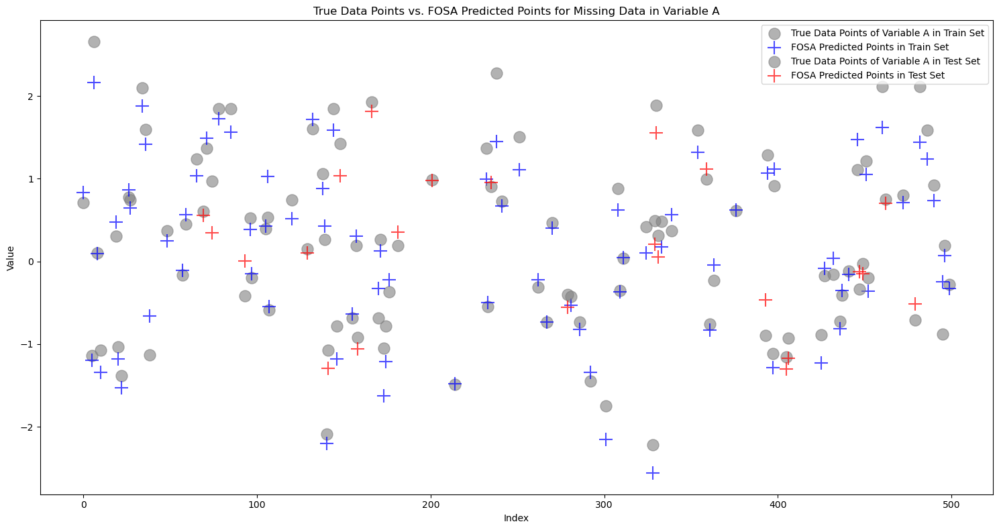

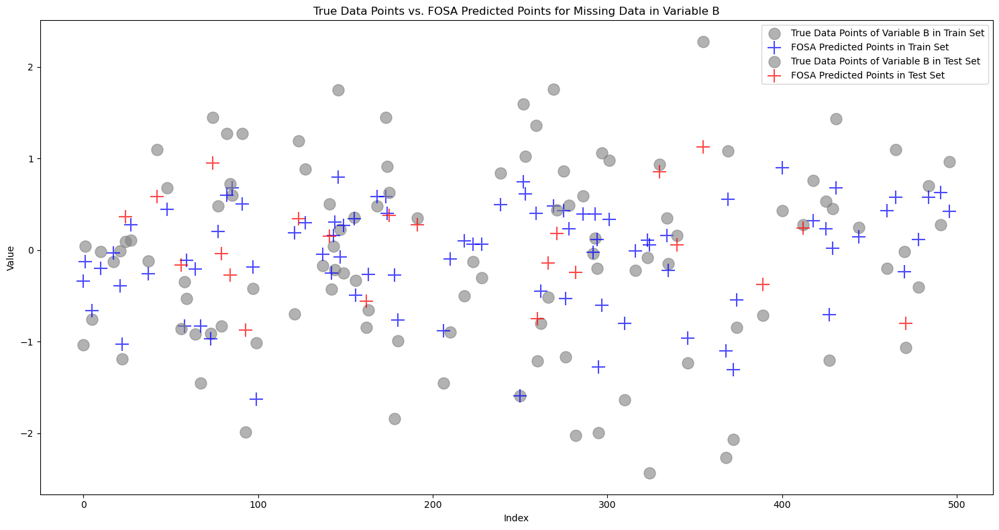

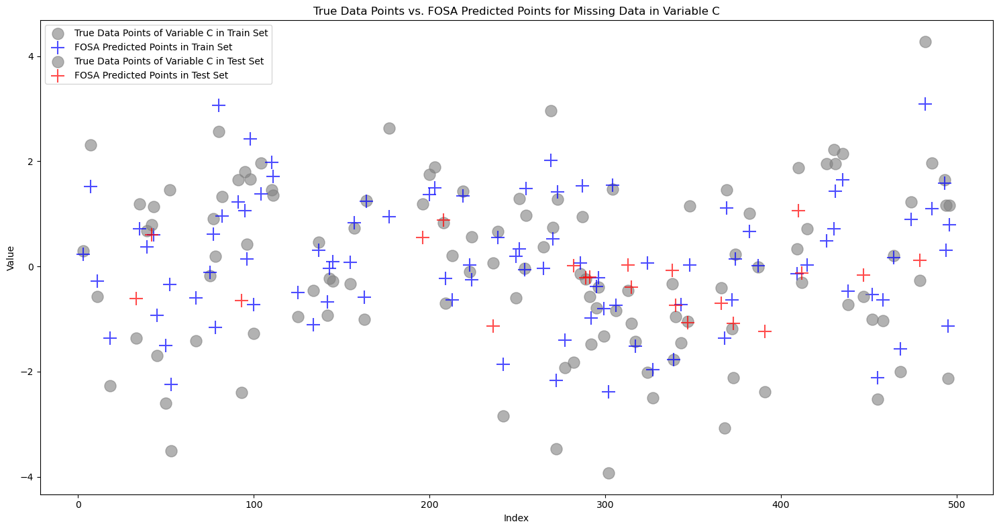

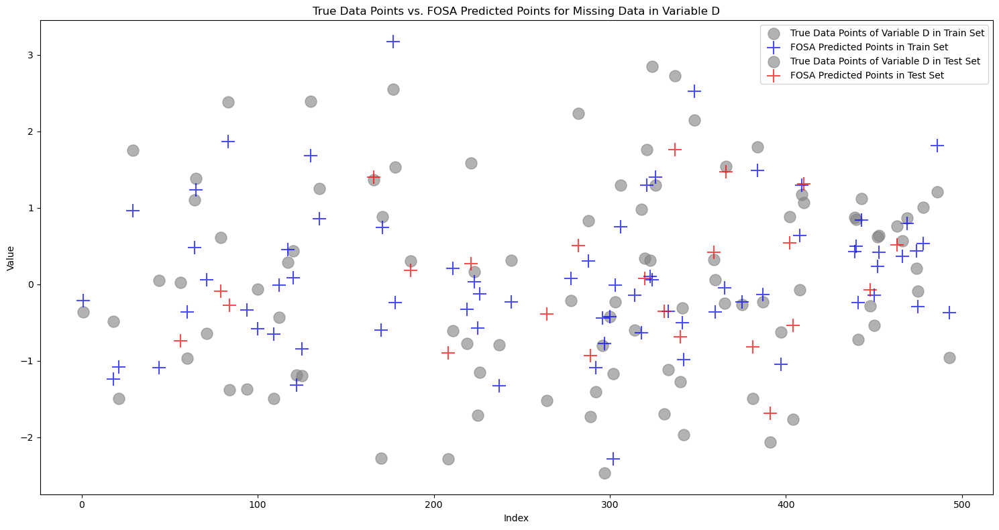

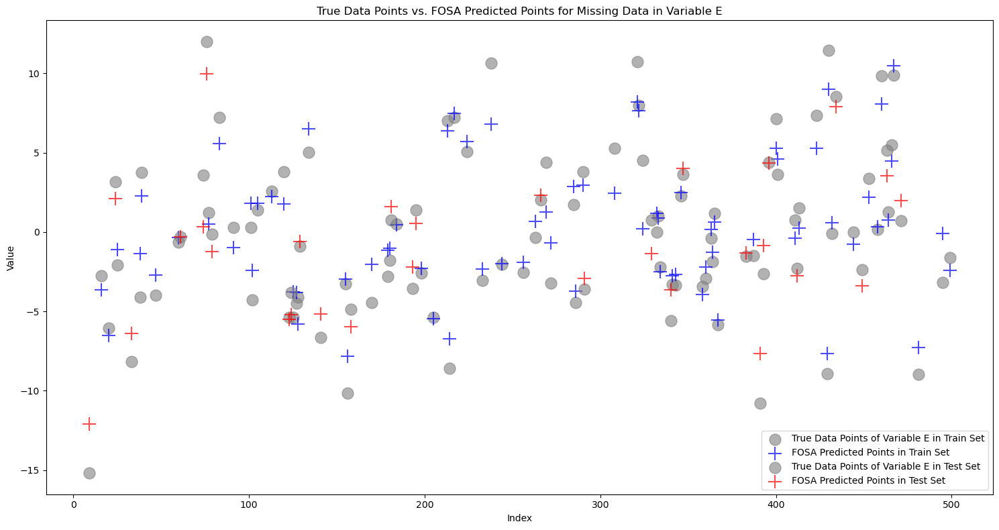

In [44]:
# FOSA-CM Visualization 

# (1) One plot for dataset_1 data points and missing data points from test_data_missing
plt.figure(figsize=(15, 8))
for col, color in zip(dataset_1.columns, ['blue', 'green', 'red', 'cyan', 'magenta']):
    plt.scatter(dataset_1.index, dataset_1[col], s=60, color='grey', alpha=0.6, label="True Data Points" if col == dataset_1.columns[0] else "")
for col in dataset_1.columns:
    missing_rows = test_data_missing[col].isnull().values  # Convert to boolean array
    if missing_rows.sum() > 0:
        plt.scatter(test_data.index[missing_rows], test_data.loc[missing_rows, col], s=90, color='red', alpha=0.7, marker='x', label="Missing Data Points" if col == dataset_1.columns[0] else "")
plt.title("True Data Points vs. Missing Data Points")
plt.xlabel("Index")
plt.ylabel("Value")
plt.legend()
plt.tight_layout()
plt.show()


# (2) 5 plots for each variable comparing true values and FIML predictions for missing values in train set
for col in dataset_1.columns:
    plt.figure(figsize=(15, 8))
    missing_rows_train = train_data_missing[col].isnull().values  # Convert to boolean array
    if missing_rows_train.sum() > 0:
        plt.scatter(train_data.index[missing_rows_train], train_data.loc[missing_rows_train, col], s=150, color='grey', alpha=0.6, label=f'True Data Points of Variable {col}')
        plt.scatter(train_data.index[missing_rows_train], train_inputs_np[missing_rows_train, dataset_1.columns.get_loc(col)], s=200, color='red', marker='+', alpha=0.7, label='FIML Predicted Points')
        plt.title(f"True Data Points vs. FIML Predicted Points for Missing Data in Variable {col} - Test Set")
        plt.xlabel("Index")
        plt.ylabel("Value")
        plt.legend()
        plt.tight_layout()
        plt.show()

# 对应的真实值 vs FOSA预测值
# (3) 5 plots for each variable comparing true values and FOSA predictions for missing values

for col in dataset_1.columns:
    plt.figure(figsize=(15, 8))
    
    # For the training set
    missing_rows_train = train_data_missing[col].isnull().values  # Convert to boolean array
    
    # For the test set
    missing_rows_test = test_data_missing[col].isnull().values  # Convert to boolean array
    
    # Display true values from dataset_1 for the missing positions in the training set
    plt.scatter(train_data.index[missing_rows_train], train_data.loc[missing_rows_train, col], s=150, color='grey', alpha=0.6, label=f'True Data Points of Variable {col} in Train Set')
    
    # Display FOSA predictions only for the missing values in the training set
    plt.scatter(train_data.index[missing_rows_train], train_predictions_np[missing_rows_train, dataset_1.columns.get_loc(col)], s=200, color='blue', marker='+', alpha=0.7, label='FOSA Predicted Points in Train Set')
    
    # Display true values from dataset_1 for the missing positions in the test set
    plt.scatter(test_data.index[missing_rows_test], test_data.loc[missing_rows_test, col], s=150, color='grey', alpha=0.6, label=f'True Data Points of Variable {col} in Test Set')
    
    # Display FOSA predictions only for the missing values in the test set
    plt.scatter(test_data.index[missing_rows_test], test_predictions_np[missing_rows_test, dataset_1.columns.get_loc(col)], s=200, color='red', marker='+', alpha=0.7, label='FOSA Predicted Points in Test Set')
    
    plt.title(f"True Data Points vs. FOSA Predicted Points for Missing Data in Variable {col}")
    plt.xlabel("Index")
    plt.ylabel("Value")
    plt.legend()
    plt.tight_layout()  # Adjust layout for better appearance
    plt.show()

In [6]:
# Draw the model structure

import torch
from torchviz import make_dot

# 创建模型实例
model = SelfAttentionModel(input_dim=5, hidden_dim=128, output_dim=5, num_heads=4, dropout_rate=0.5).to(device)

# 为模型提供一个虚拟输入
#dummy_input = torch.randn(32, 10, 5).to(device)  # 假设批量大小为32，序列长度为10，特征维度为5

batch_size = 32
seq_length = 1
feature_dim = 5

dummy_input = torch.randn(batch_size, seq_length, feature_dim).to(device)

# 前向传播
output = model(dummy_input)

# 使用make_dot生成图
dot = make_dot(output, params=dict(model.named_parameters()))

# 显示图
dot.view()


'Digraph.gv.pdf'

In [7]:
#显示简化的模型

import torch
import torch.nn as nn
from torch.autograd import Variable
from torchviz import make_dot

class SimplifiedSelfAttentionModel(nn.Module):
    def __init__(self):
        super(SimplifiedSelfAttentionModel, self).__init__()
        self.attention_block = nn.Sequential(
            nn.Linear(5, 64)
        )
        self.multihead_attention = nn.MultiheadAttention(embed_dim=64, num_heads=4)
        self.fc_block = nn.Sequential(
            nn.Linear(64, 64),
            nn.Dropout(0.5),
            nn.ReLU(),
            nn.Linear(64, 5)
        )

    def forward(self, x):
        x = self.attention_block(x)
        attn_output, _ = self.multihead_attention(x, x, x)  # Provide x as query, key, and value
        x = attn_output
        x = self.fc_block(x)
        return x.squeeze()


model = SimplifiedSelfAttentionModel()
dummy_input = torch.randn(32, 1, 5)
output = model(dummy_input)
dot = make_dot(output.mean(), params=dict(model.named_parameters()))
dot.format = 'pdf'
dot.render(filename='simplified_model')


'simplified_model.pdf'

## CDC Dataset

In [1]:
import pandas as pd

data = pd.read_csv('./CDC2020/heart_2020_cleaned.csv', delimiter=',', low_memory=False)

In [2]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319795 entries, 0 to 319794
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   HeartDisease      319795 non-null  object 
 1   BMI               319795 non-null  float64
 2   Smoking           319795 non-null  object 
 3   AlcoholDrinking   319795 non-null  object 
 4   Stroke            319795 non-null  object 
 5   PhysicalHealth    319795 non-null  float64
 6   MentalHealth      319795 non-null  float64
 7   DiffWalking       319795 non-null  object 
 8   Sex               319795 non-null  object 
 9   AgeCategory       319795 non-null  object 
 10  Race              319795 non-null  object 
 11  Diabetic          319795 non-null  object 
 12  PhysicalActivity  319795 non-null  object 
 13  GenHealth         319795 non-null  object 
 14  SleepTime         319795 non-null  float64
 15  Asthma            319795 non-null  object 
 16  KidneyDisease     31

In [3]:
print(data.columns)

Index(['HeartDisease', 'BMI', 'Smoking', 'AlcoholDrinking', 'Stroke',
       'PhysicalHealth', 'MentalHealth', 'DiffWalking', 'Sex', 'AgeCategory',
       'Race', 'Diabetic', 'PhysicalActivity', 'GenHealth', 'SleepTime',
       'Asthma', 'KidneyDisease', 'SkinCancer'],
      dtype='object')


In [4]:
data

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,No,16.60,Yes,No,No,3.0,30.0,No,Female,55-59,White,Yes,Yes,Very good,5.0,Yes,No,Yes
1,No,20.34,No,No,Yes,0.0,0.0,No,Female,80 or older,White,No,Yes,Very good,7.0,No,No,No
2,No,26.58,Yes,No,No,20.0,30.0,No,Male,65-69,White,Yes,Yes,Fair,8.0,Yes,No,No
3,No,24.21,No,No,No,0.0,0.0,No,Female,75-79,White,No,No,Good,6.0,No,No,Yes
4,No,23.71,No,No,No,28.0,0.0,Yes,Female,40-44,White,No,Yes,Very good,8.0,No,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319790,Yes,27.41,Yes,No,No,7.0,0.0,Yes,Male,60-64,Hispanic,Yes,No,Fair,6.0,Yes,No,No
319791,No,29.84,Yes,No,No,0.0,0.0,No,Male,35-39,Hispanic,No,Yes,Very good,5.0,Yes,No,No
319792,No,24.24,No,No,No,0.0,0.0,No,Female,45-49,Hispanic,No,Yes,Good,6.0,No,No,No
319793,No,32.81,No,No,No,0.0,0.0,No,Female,25-29,Hispanic,No,No,Good,12.0,No,No,No


In [3]:
import copy
data_0 = copy.deepcopy(data[['HeartDisease', 'BMI', 'PhysicalHealth', 'MentalHealth','SleepTime']])

In [4]:
data_0

,HeartDisease,BMI,PhysicalHealth,MentalHealth,SleepTime
0,No,16.60,3.0,30.0,5.0
1,No,20.34,0.0,0.0,7.0
2,No,26.58,20.0,30.0,8.0
3,No,24.21,0.0,0.0,6.0
4,No,23.71,28.0,0.0,8.0
...,...,...,...,...,...
319790,Yes,27.41,7.0,0.0,6.0
319791,No,29.84,0.0,0.0,5.0
319792,No,24.24,0.0,0.0,6.0
319793,No,32.81,0.0,0.0,12.0


In [5]:
import numpy as np

import warnings
warnings.filterwarnings("ignore")  # silence warnings

struct_data = data_0.copy()
non_numeric_columns = list(struct_data.select_dtypes(exclude=[np.number]).columns)

print(non_numeric_columns)

['HeartDisease']


In [6]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

for col in non_numeric_columns:
    struct_data[col] = le.fit_transform(struct_data[col])

struct_data

,HeartDisease,BMI,PhysicalHealth,MentalHealth,SleepTime
0,0,16.60,3.0,30.0,5.0
1,0,20.34,0.0,0.0,7.0
2,0,26.58,20.0,30.0,8.0
3,0,24.21,0.0,0.0,6.0
4,0,23.71,28.0,0.0,8.0
...,...,...,...,...,...
319790,1,27.41,7.0,0.0,6.0
319791,0,29.84,0.0,0.0,5.0
319792,0,24.24,0.0,0.0,6.0
319793,0,32.81,0.0,0.0,12.0


In [18]:
import copy
first_rows =300000
dataset_1 = copy.deepcopy(struct_data.head(first_rows))
dataset_1

,HeartDisease,BMI,PhysicalHealth,MentalHealth,SleepTime
0,0,16.60,3.0,30.0,5.0
1,0,20.34,0.0,0.0,7.0
2,0,26.58,20.0,30.0,8.0
3,0,24.21,0.0,0.0,6.0
4,0,23.71,28.0,0.0,8.0
...,...,...,...,...,...
299995,0,23.06,5.0,10.0,6.0
299996,0,31.89,0.0,0.0,5.0
299997,0,27.26,0.0,0.0,8.0
299998,0,23.11,0.0,0.0,7.0


FIML estimation succeeded.
KL Divergences for FIML Imputation on Test Data (Only for Missing Data):
{'HeartDisease': 521.119, 'BMI': 6.453, 'PhysicalHealth': 9.834, 'MentalHealth': 7.925, 'SleepTime': 3.98}

Error Metrics for FIML Imputation on Test Data (Only for Missing Data):
         Variable      MSE  R-squared  MAPE (%)
0    HeartDisease    0.669     -7.477       NaN
1             BMI  839.636    -19.896   100.029
2  PhysicalHealth   71.276     -0.146       NaN
3    MentalHealth   75.977     -0.206       NaN
4       SleepTime   52.490    -24.328   100.058


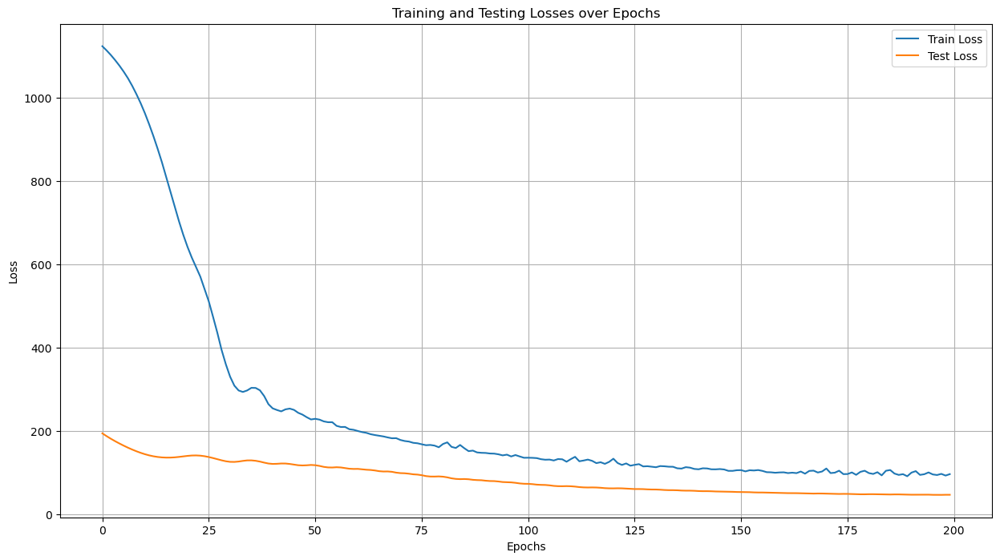


KL Divergences for Self-Attention Predictions (Only for Missing Data):
{'HeartDisease': 599.297, 'BMI': 0.93, 'PhysicalHealth': 7.612, 'MentalHealth': 14.534, 'SleepTime': 4.058}

Error Metrics for Self-Attention Predictions (Only for Missing Data):
         Variable      MSE  R-squared  MAPE (%)
0    HeartDisease    0.227     -1.876       inf
1             BMI  190.974     -3.753    36.458
2  PhysicalHealth   71.050     -0.142       inf
3    MentalHealth   72.884     -0.157       inf
4       SleepTime    9.559     -3.613    34.672
The elapsed_time of the above programming: 280.03 seconds.


In [19]:
# FOSA-CM  MSE结合协方差矩阵（CM）为损失函数。
# ver 2.0 on Aug 12, 2023. 和其他方法比较好。修正了数据标准化的信息泄漏问题。

import os
import torch
import torch.nn as nn
import torch.optim as optim
from semopy import Model
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

import time

# 记录程序开始时间
start_time = time.time()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

# Self-Attention Model Definition
class SelfAttentionModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, num_heads, dropout_rate):
        super(SelfAttentionModel, self).__init__()
        self.hidden_dim = hidden_dim
        self.embed_dim = hidden_dim
        self.linear = nn.Linear(input_dim, hidden_dim)
        self.attention = nn.MultiheadAttention(embed_dim=self.embed_dim, num_heads=num_heads)
        self.fc1 = nn.Linear(hidden_dim, hidden_dim)
        self.dropout = nn.Dropout(dropout_rate)
        self.fc2 = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        if x.dim() == 2:
            x = x.unsqueeze(1)
        batch_size, seq_length, feature_dim = x.size()
        x = x.view(batch_size * seq_length, feature_dim)
        x = self.linear(x)
        x = x.view(batch_size, seq_length, self.hidden_dim)
        x = x.transpose(0, 1)
        attn_output, _ = self.attention(x, x, x)
        attn_output = attn_output.transpose(0, 1)
        attn_output = torch.mean(attn_output, dim=1)
        x = self.fc1(attn_output)
        x = self.dropout(x)
        x = torch.relu(x)
        x = self.fc2(x)
        return x.squeeze()

# Evaluation functions: KL, MAPE
def compute_kl_divergence(p, q):
    p = np.asarray(p, dtype=np.float64) + 1e-10
    q = np.asarray(q, dtype=np.float64) + 1e-10
    return np.sum(np.where(p != 0, p * np.log(p / q), 0))

def compute_mape(true_values, predicted_values):
    return np.mean(np.abs((true_values - predicted_values) / true_values)) * 100

# Seed for reproducibility
np.random.seed(2023)

# Split the original dataset_1 into training and testing set
train_data, test_data = train_test_split(dataset_1, test_size=0.2, random_state=2023)

# Standardize the data using only the training data
scaler = StandardScaler()
train_data_scaled = pd.DataFrame(scaler.fit_transform(train_data), columns=train_data.columns)
test_data_scaled = pd.DataFrame(scaler.transform(test_data), columns=test_data.columns)

# Introduce missingness in the standardized dataset
def introduce_missing(data, missing_rate=0.4):
    modified_data = data.copy()
    for col in data.columns:
        mask = (np.random.random(len(data)) < missing_rate)
        modified_data[col][mask] = np.nan
    return modified_data

train_data_missing = introduce_missing(train_data_scaled)
test_data_missing = introduce_missing(test_data_scaled)

#train_data_missing = dataset_2_missing.iloc[train_data_scaled.index]
#test_data_missing = dataset_2_missing.iloc[test_data_scaled.index]

# FIML Model specification.
# 这个模型结构来源于经验或专业知识。是FIML这类SEM方法必须的，也可能是整个算法的弱点。
model_desc = """
BMI ~ PhysicalHealth + MentalHealth + HeartDisease + SleepTime
"""

# Use column means to fill NaN values as an initial approximation
initial_filled_train_data = train_data_missing.fillna(train_data_missing.mean())

# Use the initialized data to estimate using FIML
mod = Model(model_desc)
res = mod.fit(initial_filled_train_data, obj="FIML")

# Check if it's successful
if res.success:
    print("FIML estimation succeeded.")
    fiml_train_predictions = mod.predict(train_data_missing)
    fiml_test_predictions = mod.predict(test_data_missing)
else:
    print("FIML estimation failed. Please consider adjusting optimization parameters or use another approach.")

train_inputs_np = np.where(np.isnan(train_data_missing.values), fiml_train_predictions.values, train_data_missing.values)
test_inputs_np = np.where(np.isnan(test_data_missing.values), fiml_test_predictions.values, test_data_missing.values)

# Evaluation functions for FIML on test data
missing_rows_test_fiml, missing_cols_test_fiml = np.where(np.isnan(test_data_missing.values))
test_true_missing_fiml = test_data.to_numpy()[missing_rows_test_fiml, missing_cols_test_fiml]
test_inputs_fiml_missing = test_inputs_np[missing_rows_test_fiml, missing_cols_test_fiml]

kl_divergences_fiml_test = {}
for idx, col in enumerate(dataset_1.columns):
    col_mask = (missing_cols_test_fiml == idx)
    p = np.histogram(test_true_missing_fiml[col_mask], bins=50, density=True)[0]
    q = np.histogram(test_inputs_fiml_missing[col_mask], bins=50, density=True)[0]
    kl_divergences_fiml_test[col] = round(compute_kl_divergence(p, q), 3)

print("KL Divergences for FIML Imputation on Test Data (Only for Missing Data):")
print(kl_divergences_fiml_test)

# Error metrics for FIML on test data
error_metrics_fiml_test = {'Variable': [], 'MSE': [], 'R-squared': [], 'MAPE (%)': []}
for idx, col in enumerate(dataset_1.columns):
    col_mask = (missing_cols_test_fiml == idx)
    true_values = test_true_missing_fiml[col_mask]
    predicted_values = test_inputs_fiml_missing[col_mask]
    
    mse = round(mean_squared_error(true_values, predicted_values), 3)
    r2 = round(r2_score(true_values, predicted_values), 3)
    mape = round(compute_mape(true_values, predicted_values), 3)
    
    error_metrics_fiml_test['Variable'].append(col)
    error_metrics_fiml_test['MSE'].append(mse)
    error_metrics_fiml_test['R-squared'].append(r2)
    error_metrics_fiml_test['MAPE (%)'].append(mape)

error_metrics_df_fiml_test = pd.DataFrame(error_metrics_fiml_test)
print("\nError Metrics for FIML Imputation on Test Data (Only for Missing Data):")
print(error_metrics_df_fiml_test)

# Convert to tensors
train_inputs = torch.tensor(train_inputs_np).float().to(device)
test_inputs = torch.tensor(test_inputs_np).float().to(device)
train_targets = torch.tensor(train_data.to_numpy()).float().to(device)
test_targets = torch.tensor(test_data.to_numpy()).float().to(device)

# Model parameters
input_dim = train_data.shape[1]
output_dim = test_data.shape[1]
num_heads = 4 #4
hidden_dim = 64 #64
dropout_rate = 0.5 #0.5

# Initialize the model with He initialization
# 主要的改动是在weights_init函数中，使用了torch.nn.init.kaiming_uniform_来进行He初始化。
# 对于ReLU，He初始化比Xavier初始化更合适。
def weights_init(m):
    if isinstance(m, nn.Linear):
        torch.nn.init.kaiming_uniform_(m.weight, nonlinearity='relu')
        if m.bias is not None:
            torch.nn.init.zeros_(m.bias)

attention_model = SelfAttentionModel(input_dim, hidden_dim, output_dim, num_heads, dropout_rate).to(device)
attention_model.apply(weights_init)

# Optimizer and Loss
optimizer = optim.Adam(attention_model.parameters(), lr=0.001)
criterion = nn.MSELoss()

# Define covariance loss function
def covariance_loss(predicted, target):
    cov_pred = torch.matmul(predicted.T, predicted) / predicted.size(0)
    cov_target = torch.matmul(target.T, target) / target.size(0)
    loss = torch.norm(cov_pred - cov_target, p='fro')
    return loss

# L1 Regularization function
def l1_regularizer(model):
    l1 = torch.tensor(0.).to(device)
    for name, param in model.named_parameters():
        if 'weight' in name:
            l1 = l1 + torch.norm(param, 1)
    return l1

l1_lambda = 0.001

# Training loop
num_epochs = 200
train_losses = []
test_losses = []

for epoch in range(num_epochs):
    attention_model.train()
    optimizer.zero_grad()
    outputs = attention_model(train_inputs)
    
    # Calculate the combined loss
    mse_loss = criterion(outputs, train_targets)
    cov_loss = covariance_loss(outputs, train_targets)
    total_loss = mse_loss + cov_loss + l1_lambda * l1_regularizer(attention_model)
    
    total_loss.backward()
    torch.nn.utils.clip_grad_norm_(attention_model.parameters(), max_norm=1.0)
    optimizer.step()
    
    # Evaluation
    attention_model.eval()
    with torch.no_grad():
        test_outputs = attention_model(test_inputs)
        test_loss = criterion(test_outputs, test_targets)
    
    train_losses.append(total_loss.item())
    test_losses.append(test_loss.item())

# Plotting the losses
plt.figure(figsize=(15, 8))
plt.plot(train_losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Testing Losses over Epochs')
plt.legend()
plt.grid(True)
plt.show()


# Prediction
attention_model.eval()
with torch.no_grad():
    train_predictions = attention_model(torch.tensor(train_inputs_np).float().to(device))
    test_predictions = attention_model(torch.tensor(test_inputs_np).float().to(device))

train_predictions_np = train_predictions.cpu().numpy()
test_predictions_np = test_predictions.cpu().numpy()

# Evaluation for the Self-Attention model
missing_rows_test, missing_cols_test = np.where(np.isnan(test_data_missing.values))
test_true_missing = test_data.to_numpy()[missing_rows_test, missing_cols_test]
test_predictions_np_missing = test_predictions_np[missing_rows_test, missing_cols_test]

kl_divergences_attention = {}
for idx, col in enumerate(dataset_1.columns):
    col_mask = (missing_cols_test == idx)
    p = np.histogram(test_true_missing[col_mask], bins=50, density=True)[0]
    q = np.histogram(test_predictions_np_missing[col_mask], bins=50, density=True)[0]
    kl_divergences_attention[col] = round(compute_kl_divergence(p, q), 3)

print("\nKL Divergences for Self-Attention Predictions (Only for Missing Data):")
print(kl_divergences_attention)

error_metrics_attention = {'Variable': [], 'MSE': [], 'R-squared': [], 'MAPE (%)': []}
for idx, col in enumerate(dataset_1.columns):
    col_mask = (missing_cols_test == idx)
    true_values = test_true_missing[col_mask]
    predicted_values = test_predictions_np_missing[col_mask]
    
    mse = round(mean_squared_error(true_values, predicted_values), 3)
    r2 = round(r2_score(true_values, predicted_values), 3)
    mape = round(compute_mape(true_values, predicted_values), 3)
    
    error_metrics_attention['Variable'].append(col)
    error_metrics_attention['MSE'].append(mse)
    error_metrics_attention['R-squared'].append(r2)
    error_metrics_attention['MAPE (%)'].append(mape)

error_metrics_df_attention = pd.DataFrame(error_metrics_attention)
print("\nError Metrics for Self-Attention Predictions (Only for Missing Data):")
print(error_metrics_df_attention)

# 记录程序结束时间
end_time = time.time()

# 计算并打印运行时间
elapsed_time = end_time - start_time
print(f"The elapsed_time of the above programming: {elapsed_time:.2f} seconds.")

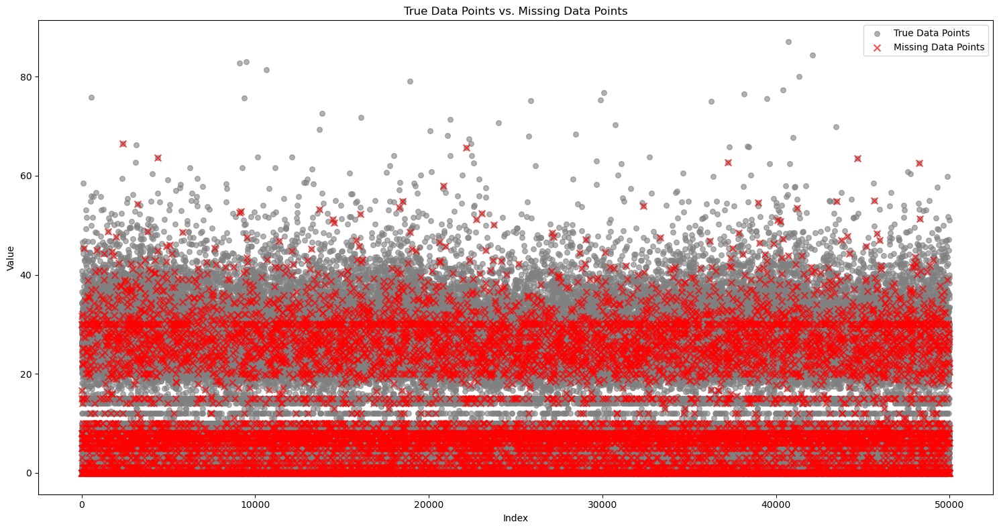

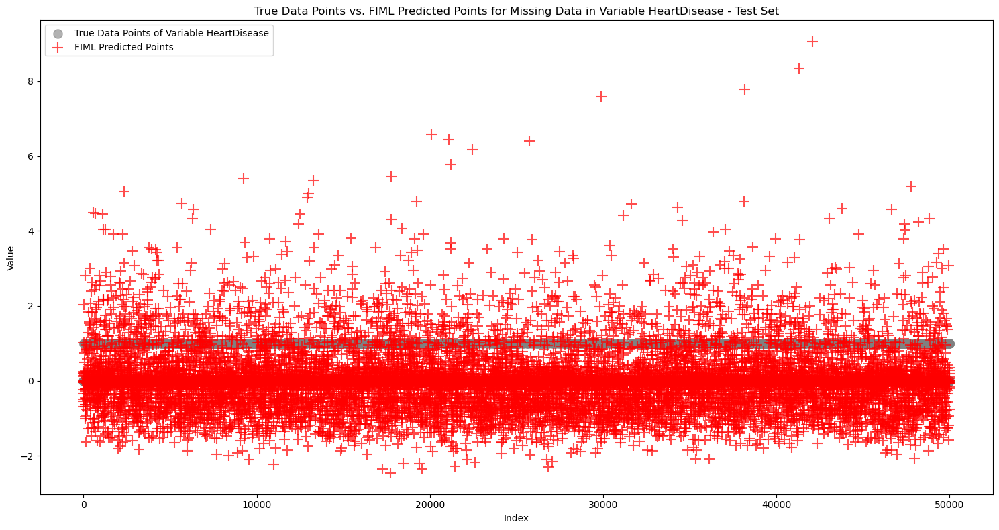

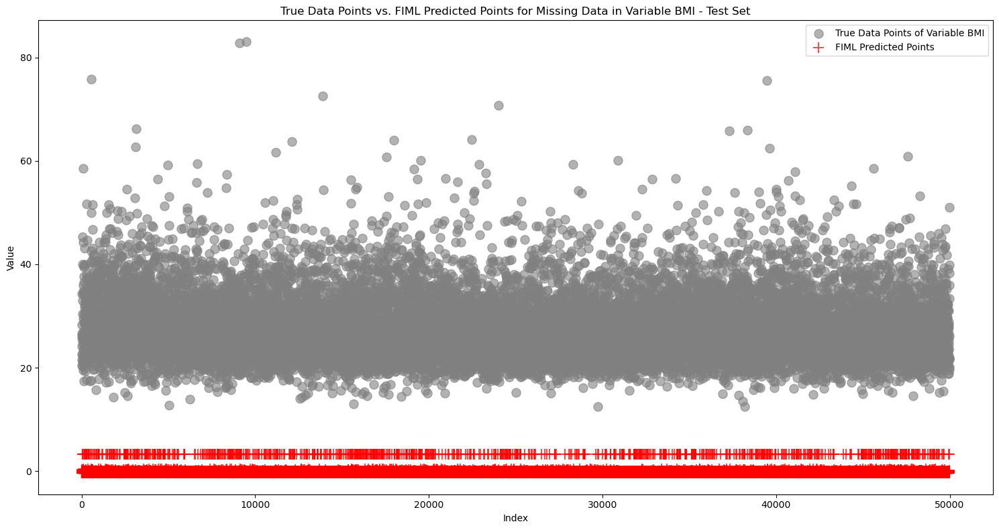

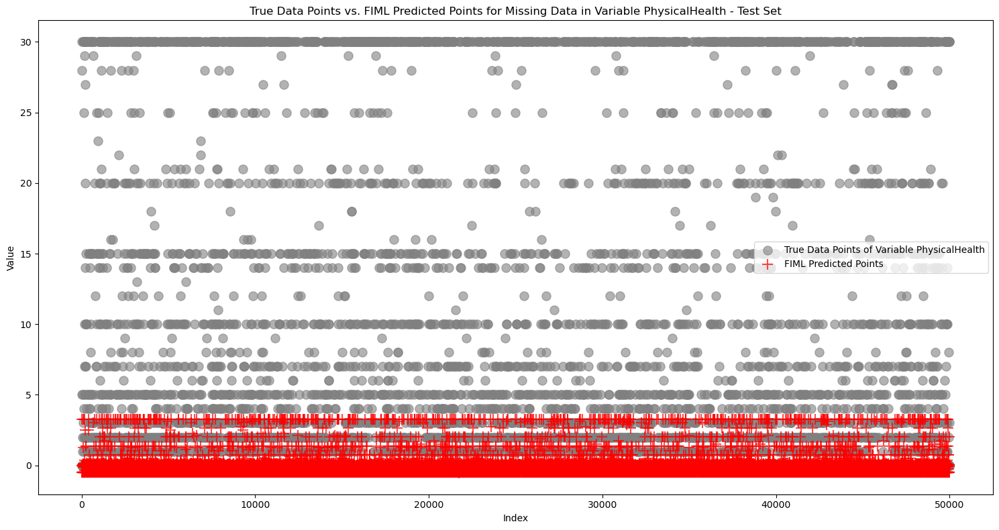

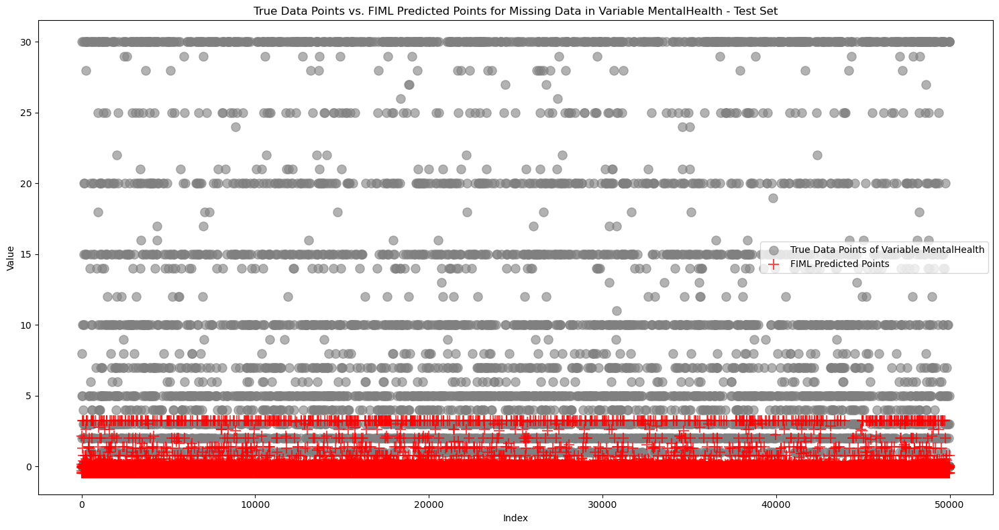

...

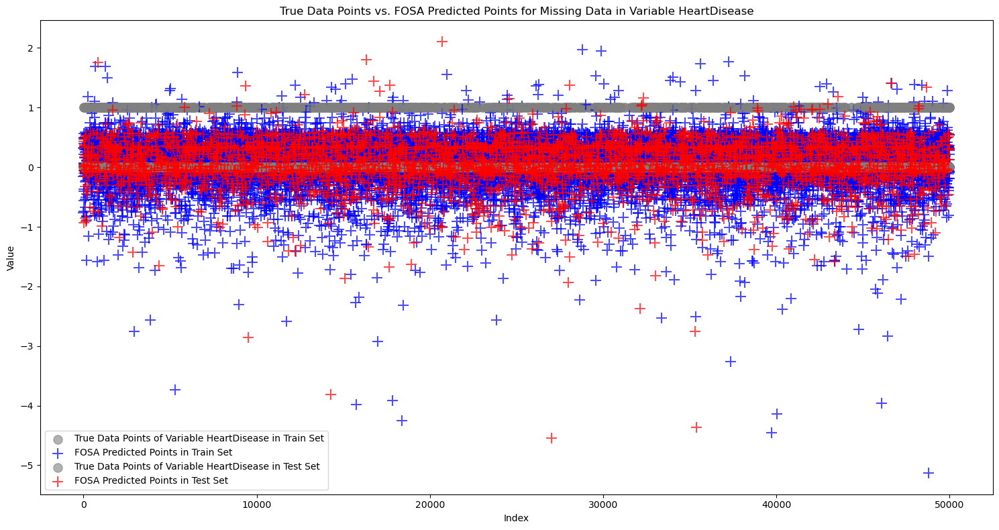

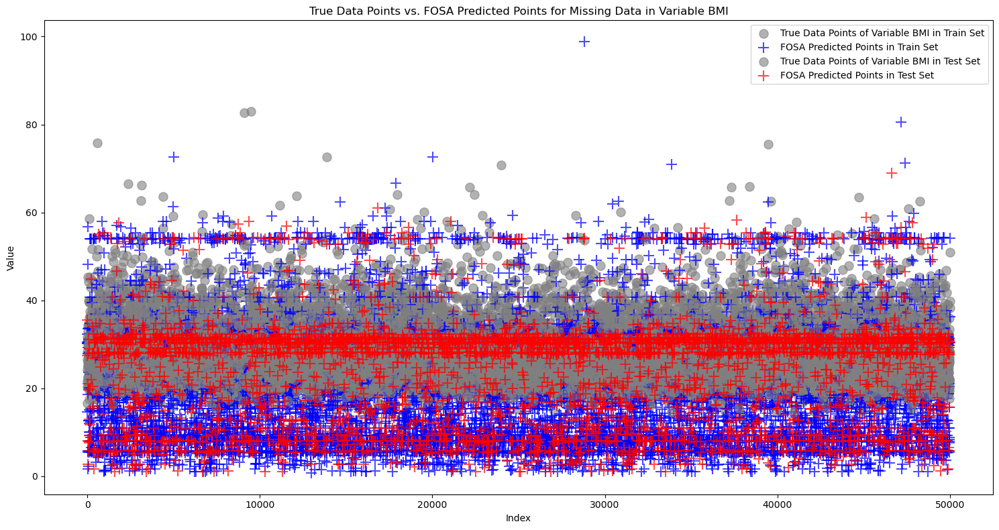

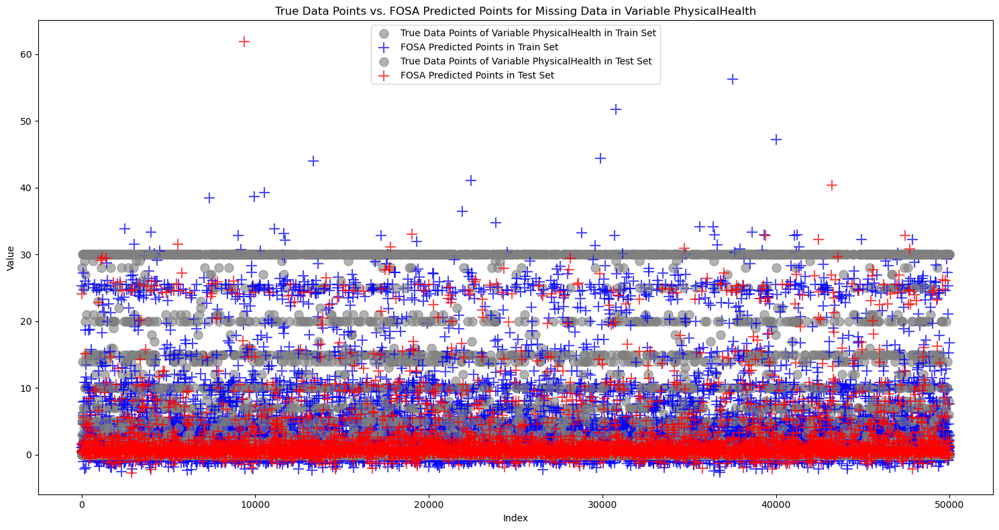

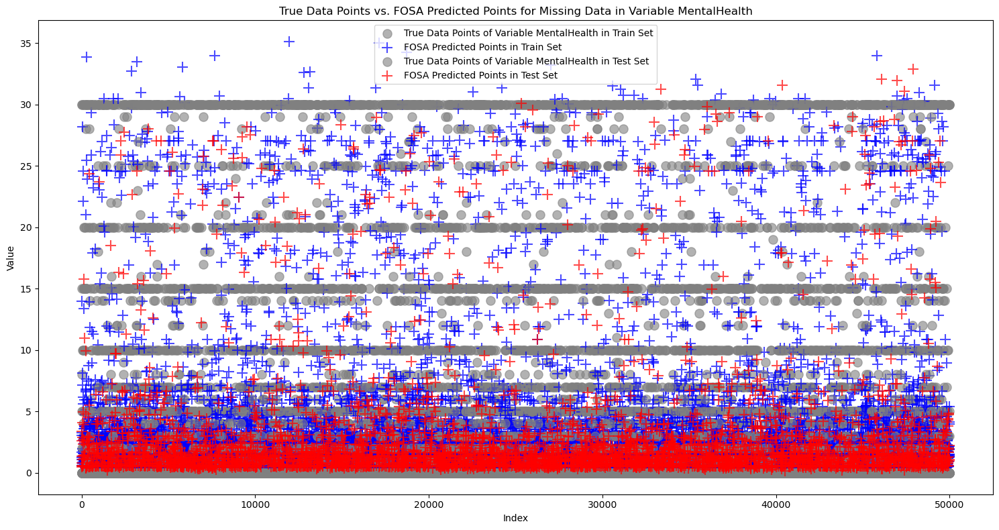

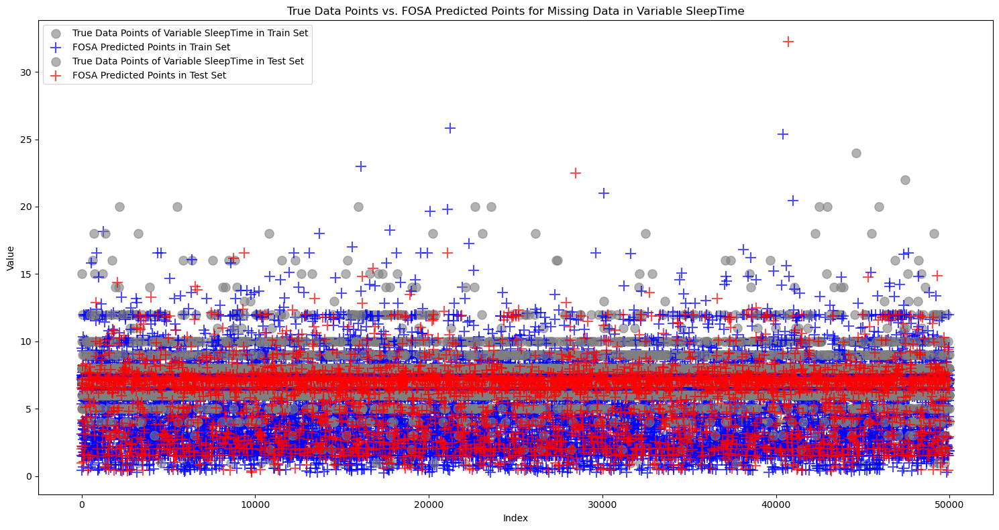

In [38]:
# FOSA-CM Visualization 

# (1) One plot for dataset_1 data points and missing data points from test_data_missing
plt.figure(figsize=(15, 8))
for col, color in zip(dataset_1.columns, ['blue', 'green', 'red', 'cyan', 'magenta']):
    plt.scatter(dataset_1.index, dataset_1[col], s=30, color='grey', alpha=0.6, label="True Data Points" if col == dataset_1.columns[0] else "")
for col in dataset_1.columns:
    missing_rows = test_data_missing[col].isnull().values  # Convert to boolean array
    if missing_rows.sum() > 0:
        plt.scatter(test_data.index[missing_rows], test_data.loc[missing_rows, col], s=50, color='red', alpha=0.7, marker='x', label="Missing Data Points" if col == dataset_1.columns[0] else "")
plt.title("True Data Points vs. Missing Data Points")
plt.xlabel("Index")
plt.ylabel("Value")
plt.legend()
plt.tight_layout()
plt.show()


# (2) 5 plots for each variable comparing true values and FIML predictions for missing values in train set
for col in dataset_1.columns:
    plt.figure(figsize=(15, 8))
    missing_rows_train = train_data_missing[col].isnull().values  # Convert to boolean array
    if missing_rows_train.sum() > 0:
        plt.scatter(train_data.index[missing_rows_train], train_data.loc[missing_rows_train, col], s=90, color='grey', alpha=0.6, label=f'True Data Points of Variable {col}')
        plt.scatter(train_data.index[missing_rows_train], train_inputs_np[missing_rows_train, dataset_1.columns.get_loc(col)], s=120, color='red', marker='+', alpha=0.7, label='FIML Predicted Points')
        plt.title(f"True Data Points vs. FIML Predicted Points for Missing Data in Variable {col} - Test Set")
        plt.xlabel("Index")
        plt.ylabel("Value")
        plt.legend()
        plt.tight_layout()
        plt.show()

# 对应的真实值 vs FOSA预测值
# (3) 5 plots for each variable comparing true values and FOSA predictions for missing values

for col in dataset_1.columns:
    plt.figure(figsize=(15, 8))
    
    # For the training set
    missing_rows_train = train_data_missing[col].isnull().values  # Convert to boolean array
    
    # For the test set
    missing_rows_test = test_data_missing[col].isnull().values  # Convert to boolean array
    
    # Display true values from dataset_1 for the missing positions in the training set
    plt.scatter(train_data.index[missing_rows_train], train_data.loc[missing_rows_train, col], s=90, color='grey', alpha=0.6, label=f'True Data Points of Variable {col} in Train Set')
    
    # Display FOSA predictions only for the missing values in the training set
    plt.scatter(train_data.index[missing_rows_train], train_predictions_np[missing_rows_train, dataset_1.columns.get_loc(col)], s=120, color='blue', marker='+', alpha=0.7, label='FOSA Predicted Points in Train Set')
    
    # Display true values from dataset_1 for the missing positions in the test set
    plt.scatter(test_data.index[missing_rows_test], test_data.loc[missing_rows_test, col], s=90, color='grey', alpha=0.6, label=f'True Data Points of Variable {col} in Test Set')
    
    # Display FOSA predictions only for the missing values in the test set
    plt.scatter(test_data.index[missing_rows_test], test_predictions_np[missing_rows_test, dataset_1.columns.get_loc(col)], s=120, color='red', marker='+', alpha=0.7, label='FOSA Predicted Points in Test Set')
    
    plt.title(f"True Data Points vs. FOSA Predicted Points for Missing Data in Variable {col}")
    plt.xlabel("Index")
    plt.ylabel("Value")
    plt.legend()
    plt.tight_layout()  # Adjust layout for better appearance
    plt.show()

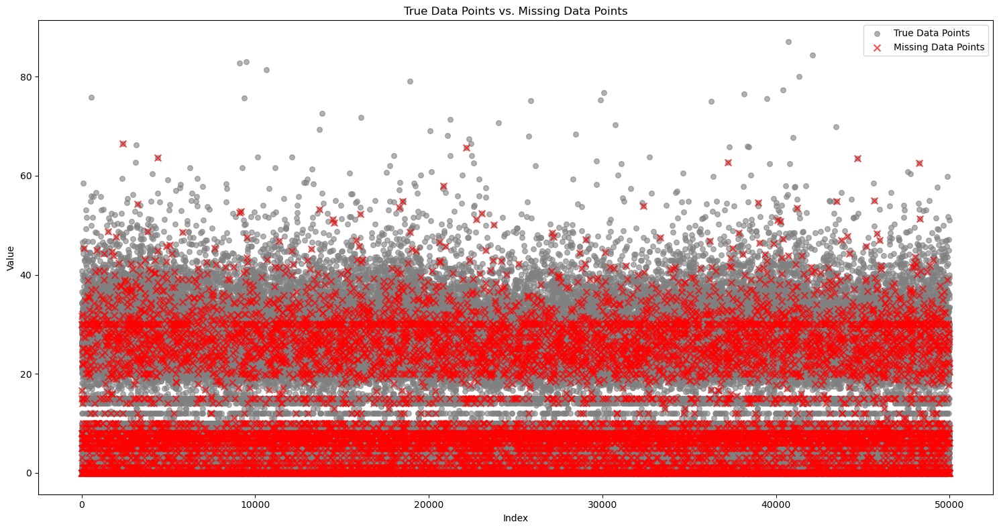

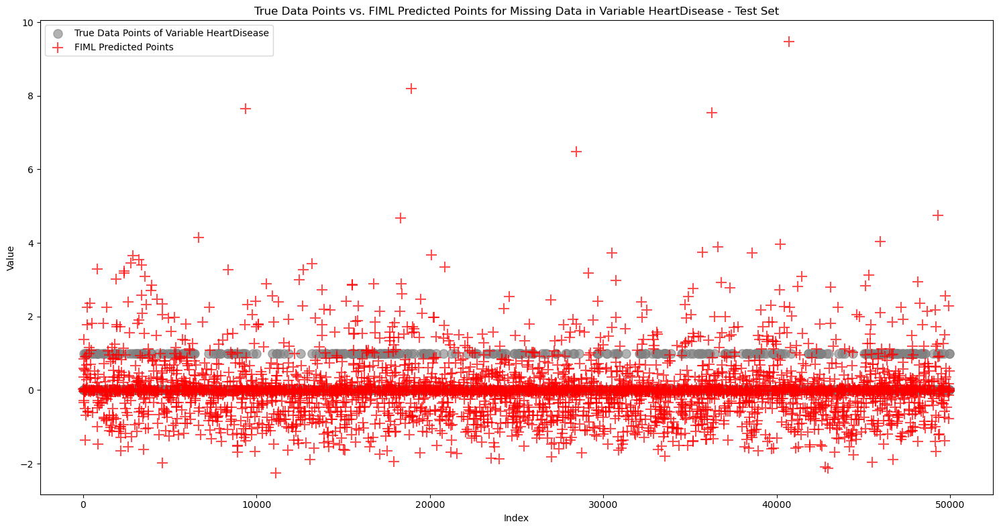

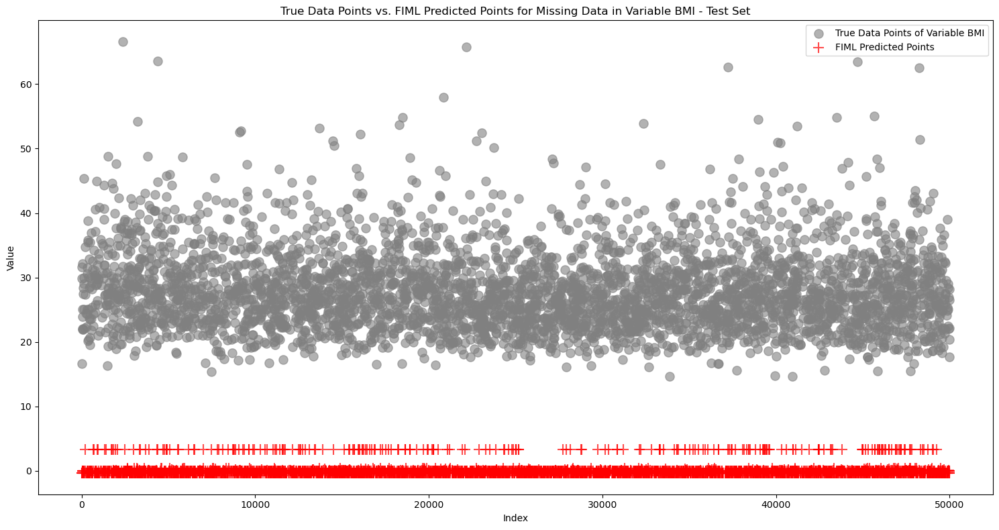

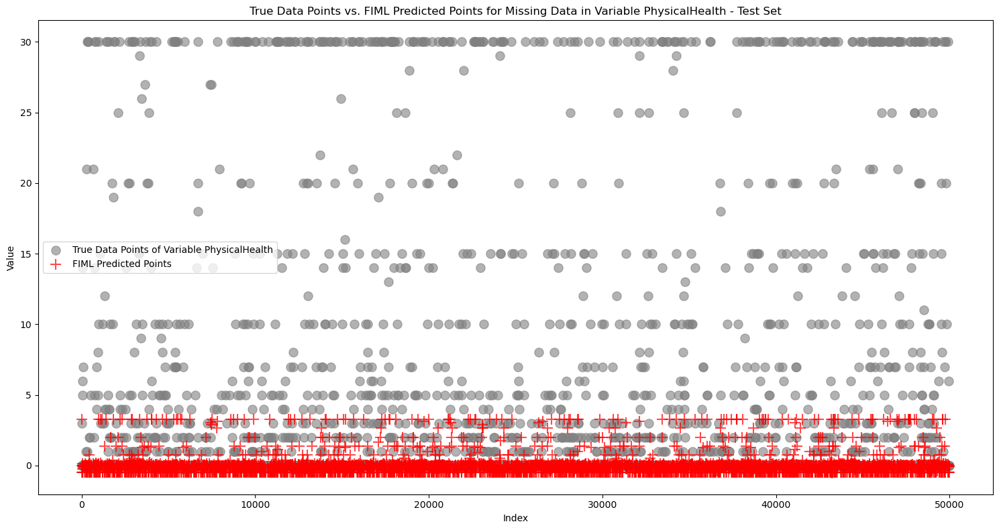

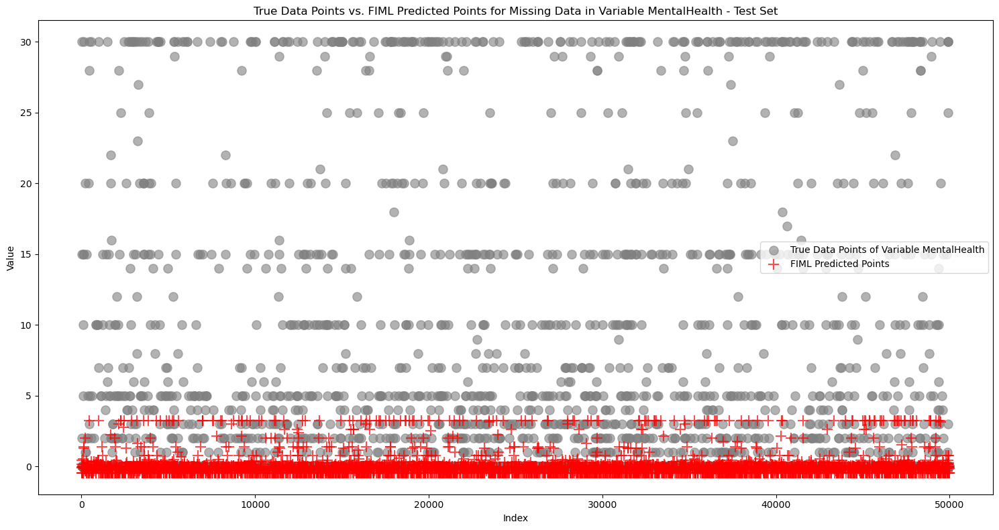

...

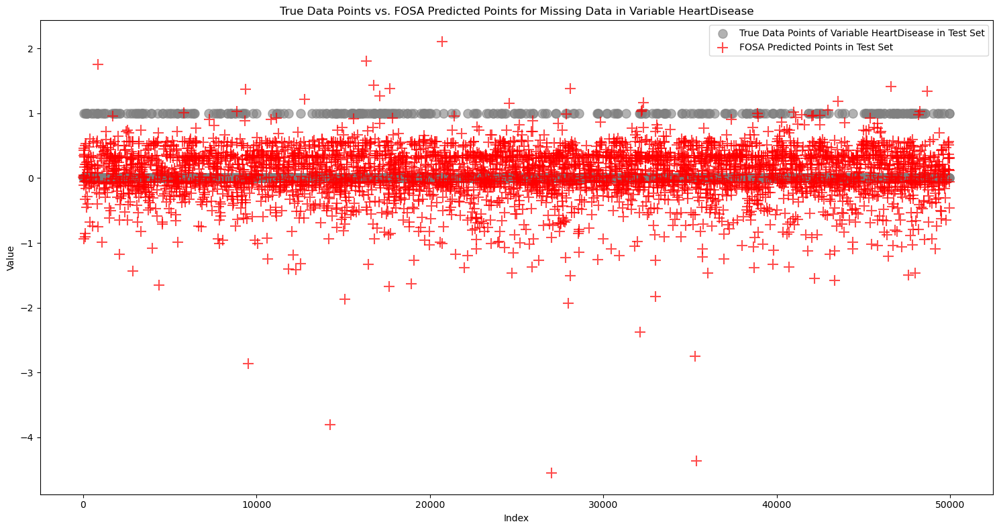

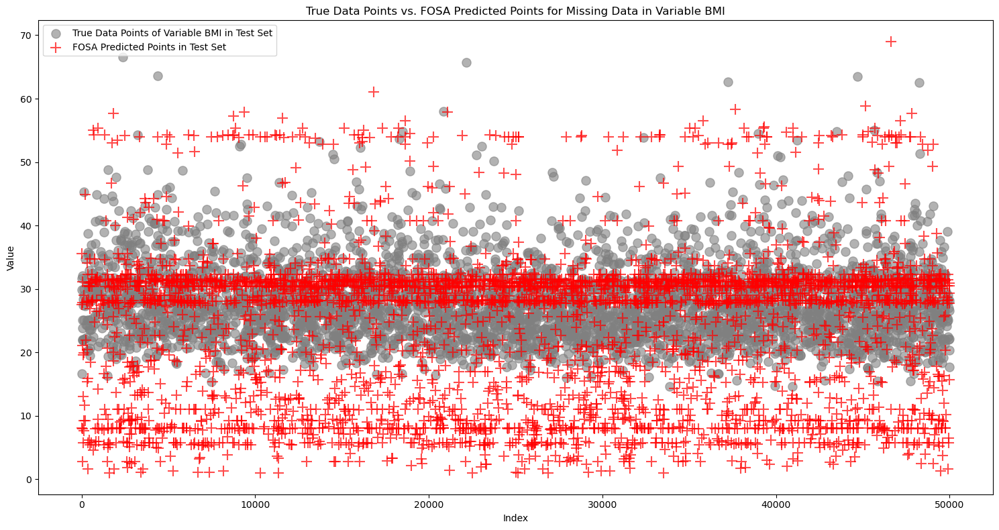

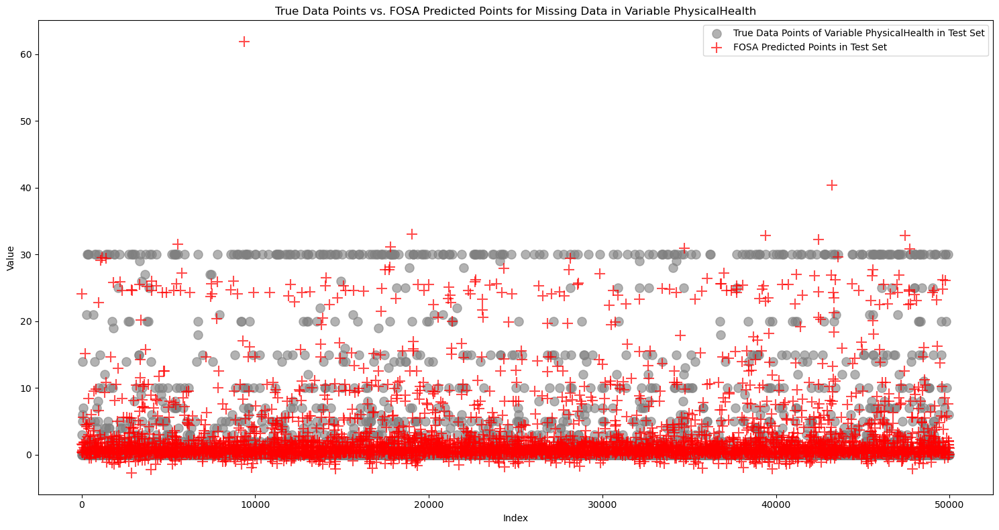

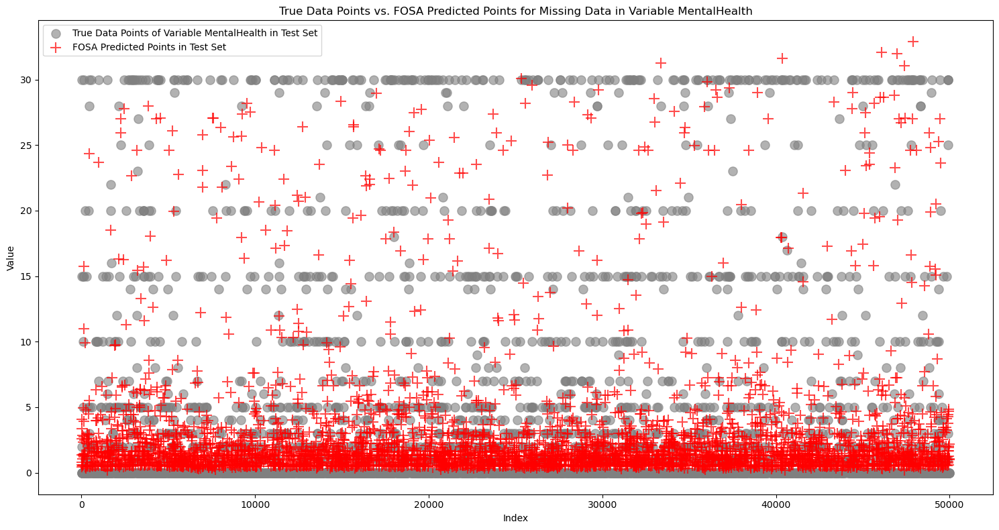

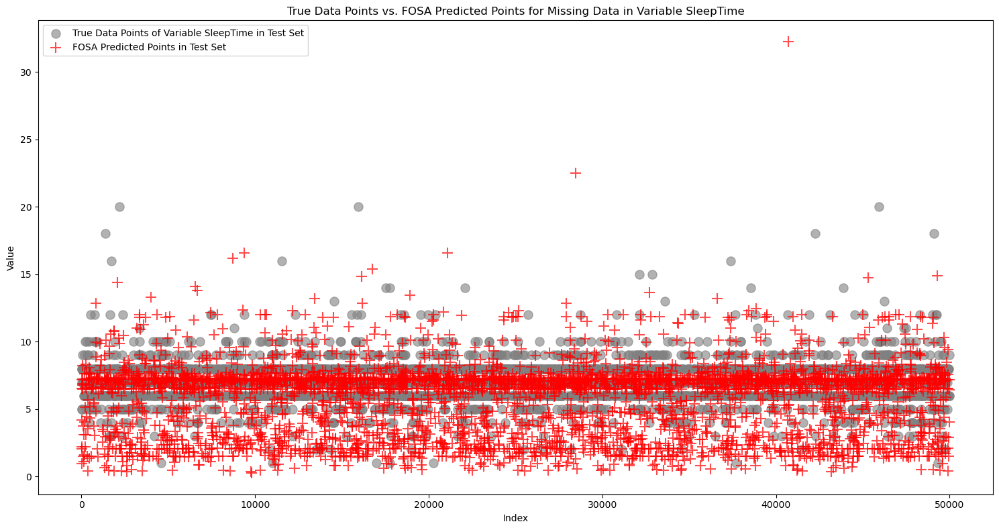

In [39]:

# FOSA-CM Visualization-2, ONLY TEST DATA

# (1) One plot for dataset_1 data points and missing data points from test_data_missing
plt.figure(figsize=(15, 8))
for col, color in zip(dataset_1.columns, ['blue', 'green', 'red', 'cyan', 'magenta']):
    plt.scatter(dataset_1.index, dataset_1[col], s=30, color='grey', alpha=0.6, label="True Data Points" if col == dataset_1.columns[0] else "")
for col in dataset_1.columns:
    missing_rows = test_data_missing[col].isnull().values  # Convert to boolean array
    if missing_rows.sum() > 0:
        plt.scatter(test_data.index[missing_rows], test_data.loc[missing_rows, col], s=50, color='red', alpha=0.7, marker='x', label="Missing Data Points" if col == dataset_1.columns[0] else "")
plt.title("True Data Points vs. Missing Data Points")
plt.xlabel("Index")
plt.ylabel("Value")
plt.legend()
plt.tight_layout()
plt.show()

# (2) 5 plots for each variable comparing true values and FIML predictions for missing values in test set
for col in dataset_1.columns:
    plt.figure(figsize=(15, 8))
    missing_rows_test = test_data_missing[col].isnull().values  # Convert to boolean array
    if missing_rows_test.sum() > 0:
        plt.scatter(test_data.index[missing_rows_test], test_data.loc[missing_rows_test, col], s=90, color='grey', alpha=0.6, label=f'True Data Points of Variable {col}')
        plt.scatter(test_data.index[missing_rows_test], test_inputs_np[missing_rows_test, dataset_1.columns.get_loc(col)], s=120, color='red', marker='+', alpha=0.7, label='FIML Predicted Points')
        plt.title(f"True Data Points vs. FIML Predicted Points for Missing Data in Variable {col} - Test Set")
        plt.xlabel("Index")
        plt.ylabel("Value")
        plt.legend()
        plt.tight_layout()
        plt.show()

# (3) 5 plots for each variable comparing true values and FOSA predictions for missing values in test set
for col in dataset_1.columns:
    plt.figure(figsize=(15, 8))
    
    # For the test set
    missing_rows_test = test_data_missing[col].isnull().values  # Convert to boolean array
    
    # Display true values from dataset_1 for the missing positions in the test set
    plt.scatter(test_data.index[missing_rows_test], test_data.loc[missing_rows_test, col], s=90, color='grey', alpha=0.6, label=f'True Data Points of Variable {col} in Test Set')
    
    # Display FOSA predictions only for the missing values in the test set
    plt.scatter(test_data.index[missing_rows_test], test_predictions_np[missing_rows_test, dataset_1.columns.get_loc(col)], s=120, color='red', marker='+', alpha=0.7, label='FOSA Predicted Points in Test Set')
    
    plt.title(f"True Data Points vs. FOSA Predicted Points for Missing Data in Variable {col}")
    plt.xlabel("Index")
    plt.ylabel("Value")
    plt.legend()
    plt.tight_layout()  # Adjust layout for better appearance
    plt.show()
